# Env setupu

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
import matplotlib.pyplot as plt
import plotly.express as px
from anndata import AnnData
from sklearn.neighbors import KernelDensity
import random
from matplotlib import pylab
import warnings
import scanpy.external as sce 
import yaml
from matplotlib.colors import TwoSlopeNorm

import seaborn as sns
import os
import sys

import random
random.seed(1)

warnings.filterwarnings('ignore')

In [2]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

In [3]:
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

In [4]:
anndata2ri.activate()

In [5]:
%load_ext rpy2.ipython

In [6]:
sc.settings.verbosity = 3  
sc.logging.print_header()
nprocs=4
np.random.seed(0)
with open("../data/resources/rcParams.yaml") as f:
    rcParamsDict = yaml.full_load(f)
    for k in rcParamsDict["rcParams"]:
        print("{} {}".format(k,rcParamsDict["rcParams"][k]))
        plt.rcParams[k] = rcParamsDict["rcParams"][k]
    for k1 in set(list(rcParamsDict)).difference(set(["rcParams"])):
        print("{} {}".format(k1,rcParamsDict[k1]))

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.22.2 scipy==1.6.2 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.9.1 louvain==0.7.0 leidenalg==0.8.3
figure.dpi 80
savefig.dpi 500
figure.figsize [10, 10]
axes.facecolor white
dotSize 20


# Configure paths

In [7]:
outdir = "../data/output"

with open("../data/resources/iPSC_lines_map.yaml", 'r') as f:
    iPSC_lines_map = yaml.load(f, Loader=yaml.FullLoader)["lines"]
colorsmap = dict(zip([i["newName"] for i in iPSC_lines_map.values()],[i["color"] for i in iPSC_lines_map.values()]))


figDir = "./figures"
if not os.path.exists(figDir):
   # Create a new directory because it does not exist
   os.makedirs(figDir)


figDir = "./figures"
if not os.path.exists(figDir):
   # Create a new directory because it does not exist
   os.makedirs(figDir)
    
#tradeSeqUtilsPath = "/opt/tradeSeq_utils.R"
tradeSeqUtilsPath = "/opt/tradeSeq_utils.R"

# var setting

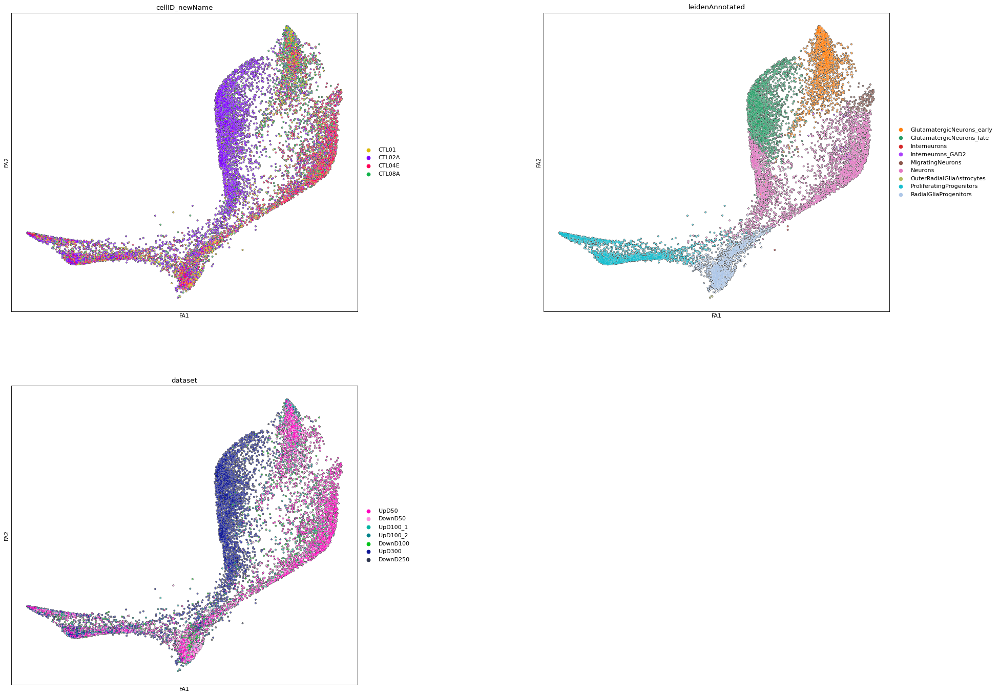

1856

In [8]:
branchTag = "Exc"
endpoint = "endpoint_GlutamatergicNeurons_both"
markers = ["EOMES","TBR1","SLA","SATB2","GRIA3","NOVA1","NNAT","MKI67","HOPX","S100B","CYP26A1"]

BranchBCs = sc.read_h5ad(outdir+"/adatas/adataPaga.h5ad")
sc.pl.draw_graph(BranchBCs[BranchBCs.obs[endpoint] == 1], color = ["cellID_newName","leidenAnnotated","dataset"], size = rcParamsDict["dotSize"],add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.4, ncols=2)
BranchBCs = BranchBCs.obs_names[BranchBCs.obs[endpoint] == 1].tolist()


HVGs=pd.read_csv(outdir+"/HVG_list_intersection_Curated_"+branchTag+"_PagaTest.txt", sep = "\t")["HVG"].tolist()
harmonyTheta = 1

len(HVGs)


## Branch specifi pre-processing

In [9]:
adataBranch = sc.read_h5ad(outdir+'/adatas/MultiplexingPreprocessing_unscaled.h5ad')[BranchBCs]
adataBranch.obs["leidenAnnotated"] =  sc.read_h5ad(outdir+"/adatas/ClusterAnnotated_Base_filt.h5ad")[adataBranch.obs_names].obs["leidenAnnotated"]
adataBranch.obs["leidenAnnotated"] =  sc.read_h5ad(outdir+"/adatas/adataPaga.h5ad")[adataBranch.obs_names].obs["leidenAnnotated"]
adataBranch.uns["leidenAnnotated_colors"] =  sc.read_h5ad(outdir+"/adatas/adataPaga.h5ad")[adataBranch.obs_names].uns["leidenAnnotated_colors"]


goodcls = adataBranch.obs.groupby(["leidenAnnotated"]).size()[adataBranch.obs.groupby(["leidenAnnotated"]).size() >= 50].index.tolist()
adataBranch = adataBranch[adataBranch.obs["leidenAnnotated"].isin(goodcls)]


adataBranch.layers["unscaled"] = adataBranch.X.copy()


sc.pp.normalize_total(adataBranch, target_sum=1e4)

sc.pp.log1p(adataBranch)
adataBranch.raw = adataBranch
adataBranch = adataBranch[:,HVGs]
adataBranch.var["highly_variable"] = True
sc.pp.regress_out(adataBranch, ['total_counts','pct_counts_mt'], n_jobs=4)
sc.pp.scale(adataBranch, zero_center=False)
#adataBranch.X = adataBranch.X + np.abs(adataBranch.X.min())

normalizing counts per cell
    finished (0:00:00)
regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:05)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


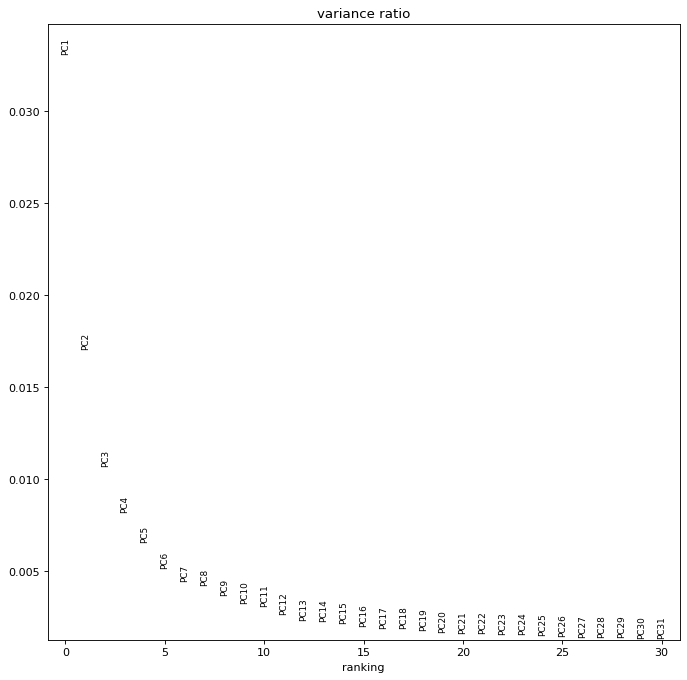

2023-07-24 09:22:21,866 - harmonypy - INFO - Iteration 1 of 20
2023-07-24 09:22:23,429 - harmonypy - INFO - Iteration 2 of 20
2023-07-24 09:22:24,966 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


In [10]:
sc.tl.pca(adataBranch, svd_solver='arpack', use_highly_variable=True, random_state=0)
sc.pl.pca_variance_ratio(adataBranch)
sce.pp.harmony_integrate(adataBranch, 'dataset', max_iter_harmony=20,adjusted_basis="X_pca",random_state = 0, theta = harmonyTheta, lamb = 2)
#sc.pp.neighbors(adataBranch,use_rep="X_pca",n_neighbors=50, n_pcs=10, random_state=0)

sc.pp.neighbors(adataBranch,use_rep="X_pca",n_neighbors=60, n_pcs=9, random_state=0)

sc.tl.umap(adataBranch, random_state=0)

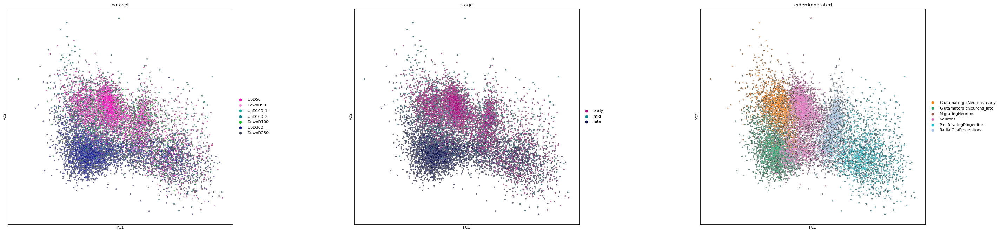

In [11]:
sc.pl.pca(adataBranch, color = ["dataset","stage",'leidenAnnotated'], size = rcParamsDict["dotSize"],add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98',wspace=.4)

## Paga

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:01)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


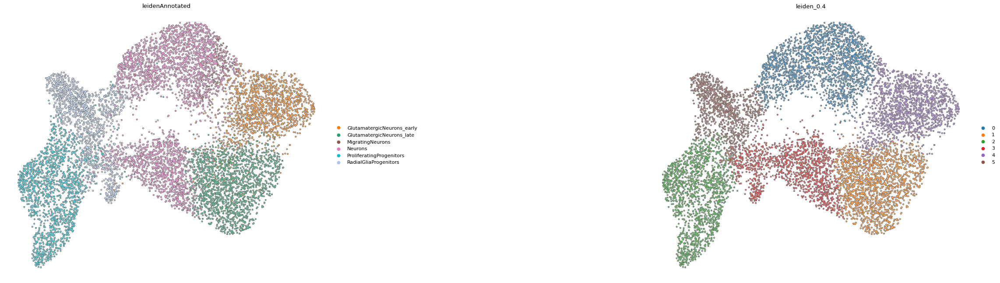

--> added 'pos', the PAGA positions (adata.uns['paga'])


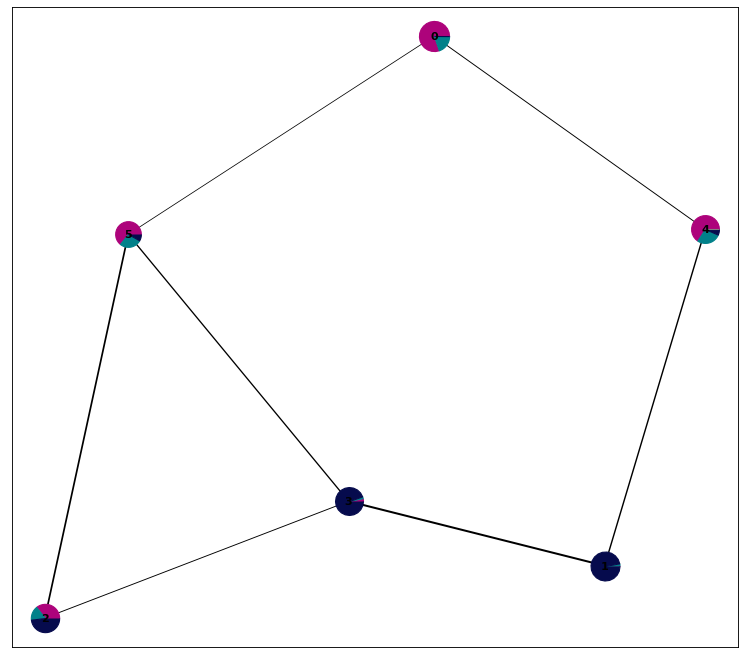

[2, 3, 1]


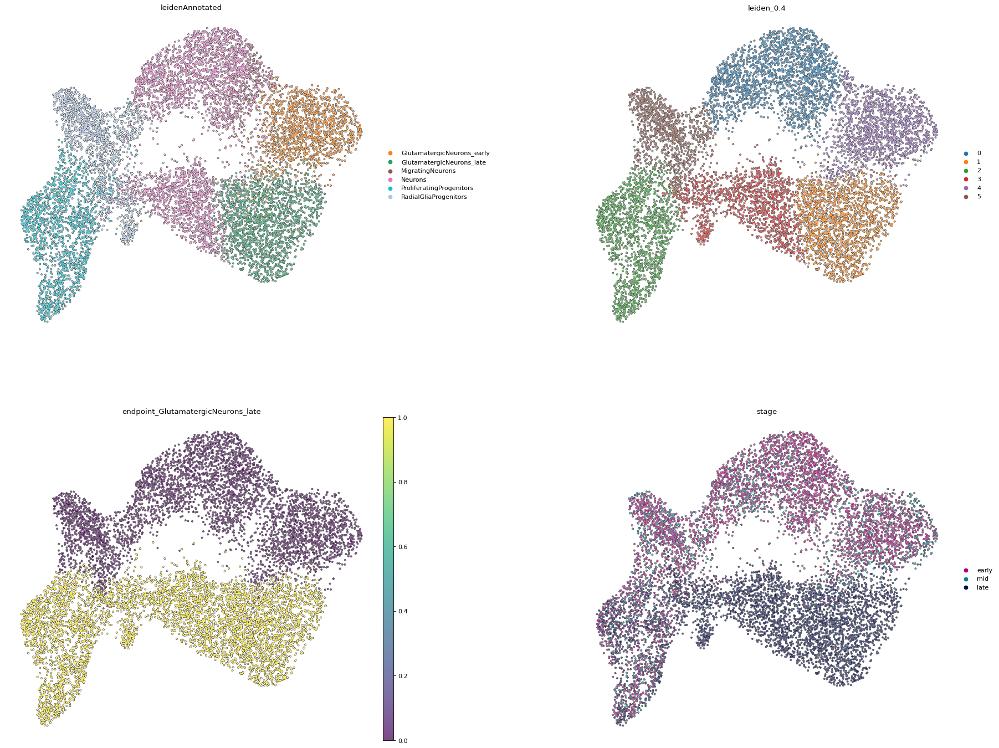

[2, 5, 0, 4]


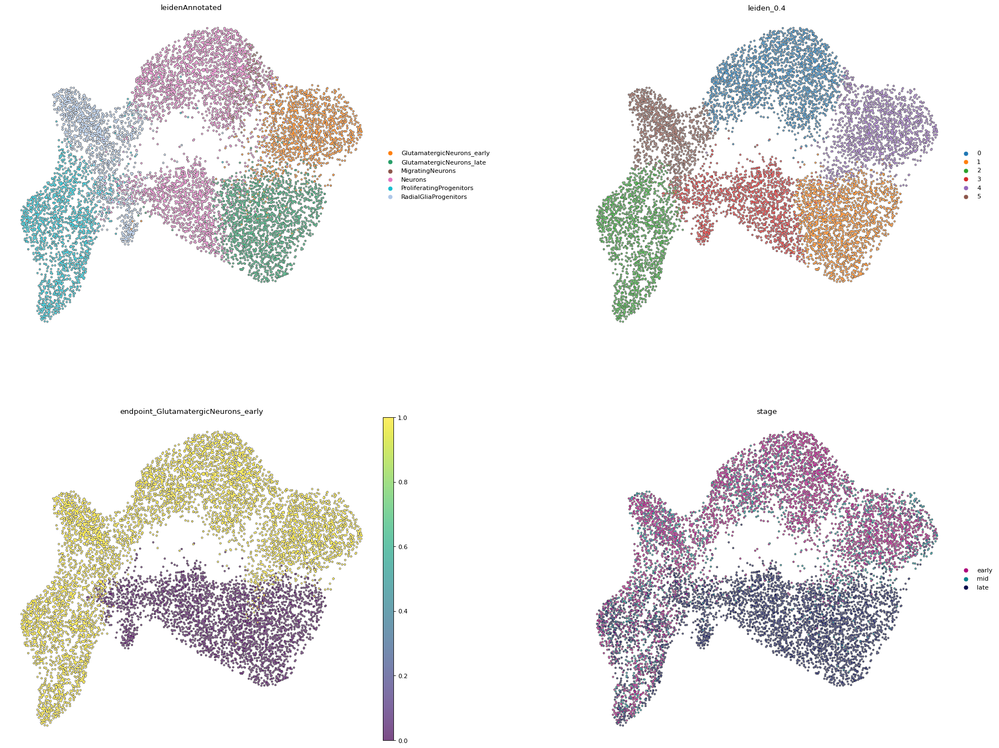

In [12]:
adataPaga = adataBranch.copy()
thresholdPagaEdges = 0.06

leidenres = .4
sc.tl.leiden(adataPaga, resolution=leidenres, key_added="leiden_"+str(leidenres), random_state=0)

adataPaga.obs.groupby("leiden_"+str(leidenres)).size()

sc.tl.paga(adataPaga, groups="leiden_"+str(leidenres), use_rna_velocity=False)

## Nuclei coordinates creation for paga

groups="leiden_"+str(leidenres)
basis="X_umap"
if 'embeddings' in globals():
    del embeddings
for l in adataPaga.obs[groups].cat.categories:
    test=adataPaga.obsm[basis][adataPaga.obs[groups] == l]
    x=np.mean(test[:,0])
    y=np.mean(test[:,1])
    if not 'embeddings' in globals():
        embeddings = np.array([x,y])
    else:
        embeddings=np.vstack([embeddings,np.array([x,y])])

sc.pl.umap(adataPaga, color = ["leidenAnnotated","leiden_"+str(leidenres)],ncols=2, 
           size = rcParamsDict["dotSize"],add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', frameon=False,  legend_loc="right margin",wspace =.8)

sc.pl.paga(adataPaga, pos=embeddings, max_edge_width=2, threshold = thresholdPagaEdges, color = "stage", node_size_scale=4, save="Paga.svg")

#[22, 33, 40, 37, 9, 12, 20, 31, 6, 36, 3, 29]

## Shortest paths

# Setting terminal states from leiden + annotation
endPointsMap = pd.crosstab(adataPaga.obs["leidenAnnotated"],adataPaga.obs["leiden_"+str(leidenres)]) / pd.crosstab(adataPaga.obs["leidenAnnotated"],adataPaga.obs["leiden_"+str(leidenres)]).sum(axis = 0)
endPointsMap = endPointsMap.idxmax().to_dict()
endPointsMap = dict((v,int(k)) for k,v in endPointsMap.items() if v in ["GlutamatergicNeurons_late","GlutamatergicNeurons_early"])
endPointsMap

#endPointsMap = {
# "GlutamatergicNeurons_early":3,
#"GlutamatergicNeurons_late":1,
#}

TOP2Aadata = adataPaga[:,"TOP2A"].copy()
TOP2Aadata.obs["TOP2A"] = TOP2Aadata.X.flatten()
root = int(TOP2Aadata.obs.groupby("leiden_"+str(leidenres))["TOP2A"].mean().idxmax())
del TOP2Aadata

# Setting terminal states from leiden + annotation



import networkx as nx
testGraph = nx.from_numpy_matrix(adataPaga.uns["paga"]["connectivities"].todense(), parallel_edges=False, create_using=None )

#Here we manually remove edge between Early and Late endpoints to avoid closed loop due to their similarity
testGraph.remove_edge(endPointsMap["GlutamatergicNeurons_late"], endPointsMap["GlutamatergicNeurons_early"])

testGraph.remove_edges_from([(n1, n2) for n1, n2, w in testGraph.edges(data="weight") if w < thresholdPagaEdges])
for t in testGraph.edges(data="weight"):
    testGraph[t[0]][t[1]]["weight"] = 1-t[2]

for endpoint in list(endPointsMap.keys()):
    sp = nx.shortest_path(testGraph, source=root, target=endPointsMap[endpoint], weight="weight", method='bellman-ford')
    print(sp)
    #adataNeurons_vel.obs["endpoint_"+endpoint] = False
    adataPaga.obs["endpoint_"+str(endpoint)] = adataPaga.obs["leiden_"+str(leidenres)].astype(int).isin(sp).astype(int)
    sc.pl.umap(adataPaga, color = ["leidenAnnotated","leiden_"+str(leidenres),"endpoint_"+str(endpoint),"stage"],ncols=2, 
           size = rcParamsDict["dotSize"],add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98',  frameon=False, wspace=.4, legend_loc="right margin")

# DPT

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99498755 0.988162   0.98487335 0.98246974 0.9682833
     0.9659444  0.9648555  0.9537523  0.9417448  0.93550366 0.9344169
     0.9280085  0.9246718  0.91359776]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


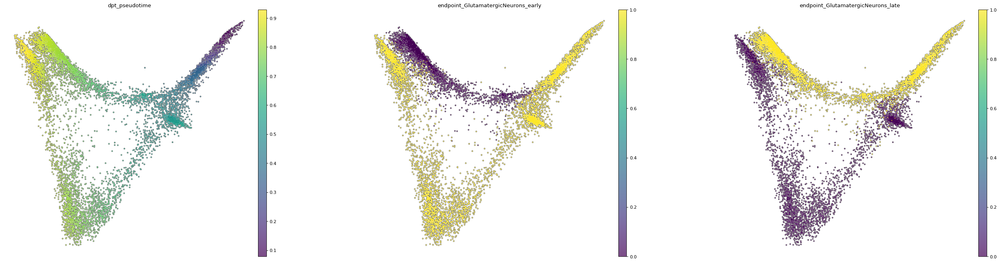

In [13]:
RootName = adataPaga.obs_names[adataPaga[:, ["TOP2A"]].X.argmax()]
root_idx = np.where(adataPaga.obs_names == RootName)[0][0]
adataPaga.uns['iroot'] = root_idx

sc.tl.diffmap(adataPaga)
sc.tl.dpt(adataPaga)
sc.pl.diffmap(adataPaga, color = ["dpt_pseudotime","endpoint_"+list(endPointsMap.keys())[1],"endpoint_"+list(endPointsMap.keys())[0]],size = rcParamsDict["dotSize"],add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', frameon=False, wspace=.3, legend_loc="on data")


In [14]:
adataPaga = adataPaga[adataPaga.obs["endpoint_GlutamatergicNeurons_early"] + adataPaga.obs["endpoint_GlutamatergicNeurons_late"] > 0]

In [15]:
adataPaga[adataPaga.obs["endpoint_GlutamatergicNeurons_early"] == 1].write_h5ad(outdir+"/adatas/AdataLineage.Exc_early.h5ad")
adataPaga[adataPaga.obs["endpoint_GlutamatergicNeurons_late"] == 1].write_h5ad(outdir+"/adatas/AdataLineage.Exc_late.h5ad")

In [16]:
#adataPaga = sc.read_h5ad(outdir+"/adatas/AdataLineage."+branchTag+".h5ad")

In [17]:
#del adataPaga

# Tradeseq

In [18]:
lineage1 = ["endpoint_GlutamatergicNeurons_early"]
lineage2 = ["endpoint_GlutamatergicNeurons_late"]

lineageOrder = ["endpoint_GlutamatergicNeurons_early","endpoint_GlutamatergicNeurons_late"]

In [19]:
obs = adataPaga.obs
obsm = adataPaga.obsm


#adataTradeseq = sc.read_h5ad(outdir+'/adatas/MultiplexingPreprocessing_unscaled.h5ad')[obs.index,HVGs]

adataTradeseq = sc.read_h5ad(outdir+'/adatas/MultiplexingPreprocessing_unscaled.h5ad')[obs.index]

ExtraNormGenes = random.sample(adataTradeseq.var_names[~adataTradeseq.var_names.isin(HVGs)].tolist(), len(HVGs))
adataTradeseq = adataTradeseq[:,HVGs+ExtraNormGenes]

adataTradeseq.uns["leidenAnnotated_colors"] =  adataBranch[adataTradeseq.obs_names].uns["leidenAnnotated_colors"]

adataTradeseq.obs = obs.loc[adataTradeseq.obs_names]
adataTradeseq = adataTradeseq[:,~adataTradeseq.var_names.str.startswith('MT-')]
adataTradeseq = adataTradeseq[:,~adataTradeseq.var_names.str.startswith(("RPS","RPL"))]
adataTradeseq.obsm = obsm

# we store info about lineages to balance among them
adataTradeseq.obs["Trajectories"] = np.nan
adataTradeseq.obs["Trajectories"] = np.where(adataTradeseq.obs[lineage1] == 1, lineage1[0],lineage2[0] )
adataTradeseq.obs["Trajectories"] = np.where((adataTradeseq.obs[lineage1[0]] + adataTradeseq.obs[lineage2[0]]) == 2,'Common',adataTradeseq.obs["Trajectories"]   )



#Trim extreme values of DPT (for potentially low amount of cells)
trimExtremes = [0.01,.99]
minDPT, maxDPT = np.quantile(adataTradeseq.obs["dpt_pseudotime"], trimExtremes)
adataTradeseq = adataTradeseq[(adataTradeseq.obs["dpt_pseudotime"] > minDPT) & (adataTradeseq.obs["dpt_pseudotime"] < maxDPT)]

In [20]:
## TrimPseudotime extremes and keep common cells
adataTradeseq.obs["dpt_bin"] = pd.cut(adataTradeseq.obs["dpt_pseudotime"], 100)
CommonCells = adataTradeseq.obs_names[adataTradeseq.obs["Trajectories"] == 'Common'].tolist()



In [21]:
pd.crosstab(adataTradeseq.obs["Trajectories"],adataTradeseq.obs["dpt_bin"])

dpt_bin,"(0.0448, 0.0548]","(0.0548, 0.0638]","(0.0638, 0.0729]","(0.0729, 0.0819]","(0.0819, 0.091]","(0.091, 0.1]","(0.1, 0.109]","(0.109, 0.118]","(0.118, 0.127]","(0.127, 0.136]",...,"(0.861, 0.87]","(0.87, 0.879]","(0.879, 0.888]","(0.888, 0.897]","(0.897, 0.906]","(0.906, 0.915]","(0.915, 0.924]","(0.924, 0.933]","(0.933, 0.942]","(0.942, 0.951]"
Trajectories,,,,,,,,,,,,,,,,,,,,,
Common,40,33,17,23,16,27,15,12,18,14,...,0,0,0,0,0,0,0,0,0,0
endpoint_GlutamatergicNeurons_early,0,0,0,0,0,0,0,0,0,0,...,127,116,124,109,87,91,70,64,35,42
endpoint_GlutamatergicNeurons_late,0,0,0,0,0,0,0,0,0,0,...,99,60,43,15,12,2,1,0,0,0


In [22]:
# Define subsampling rates
minVals = pd.crosstab(adataTradeseq.obs["Trajectories"],adataTradeseq.obs["dpt_bin"]).loc[lineageOrder].min()

bclist = []
for dptbin in minVals.index.tolist():
    for i in lineageOrder: 
        BINcells = adataTradeseq.obs_names[(adataTradeseq.obs["dpt_bin"] == dptbin) & (adataTradeseq.obs["Trajectories"] == i)].tolist()
        bclist.extend(random.sample(BINcells, minVals.loc[dptbin]))
        
adataTradeseq = adataTradeseq[bclist+CommonCells]
adataTradeseq = adataTradeseq[:,adataTradeseq.X.sum(axis = 0) > 0]

ExpressedGenes = adataTradeseq.var_names.tolist()

In [23]:
#We keep only genes with at least 1 count in each trajectory
adataTradeseq = adataTradeseq[:,(adataTradeseq.X.todense().T.dot(pd.get_dummies(adataTradeseq.obs["Trajectories"])) > 0).sum(axis = 1) ==3]

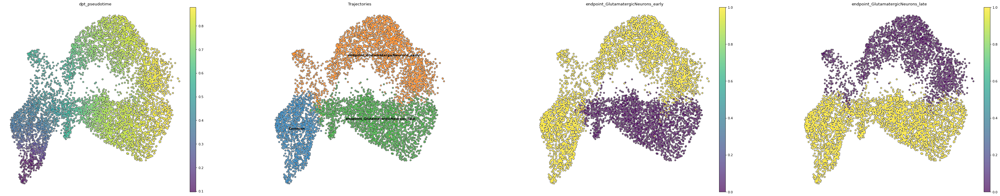

In [24]:
sc.pl.umap(adataTradeseq, color = ["dpt_pseudotime","Trajectories",lineage1[0],lineage2[0]],size = 50
           ,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', frameon=False, wspace=.3, legend_loc="on data")


In [25]:
cellWeights = adataTradeseq.obs[lineageOrder]
cellWeights = np.matrix(cellWeights.to_numpy())


pseudotime = adataTradeseq.obs["dpt_pseudotime"]
pseudotime = pd.DataFrame({lineageOrder[0]:pseudotime,lineageOrder[1]:pseudotime})
pseudotime = np.matrix(pseudotime.to_numpy())

# Transpose needed!
counts = adataTradeseq.X.T.todense()
counts = counts + abs(counts.min())

varnames = adataTradeseq.var_names.tolist()

In [26]:
import anndata2ri
import rpy2
anndata2ri.activate()
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [27]:
%%R -i tradeSeqUtilsPath

source(tradeSeqUtilsPath)


In [28]:
%%R -i cellWeights -i pseudotime -i counts -i varnames
set.seed(8)

library(tradeSeq)
library(ggplot2)


w <- as.matrix(cellWeights)
dpt <- as.matrix(pseudotime)
cMatrix <- as.matrix(counts)


gamObj <- fitGAM(cMatrix, verbose = TRUE, pseudotime = dpt, cellWeights = w, nknots = 6, sce=FALSE)
names(gamObj) <- varnames


  |                                                  | 0 % ~calculating   |+                                                 | 1 % ~13m 16s       |+                                                 | 2 % ~14m 09s       |++                                                | 3 % ~13m 37s       |++                                                | 4 % ~13m 03s       |+++                                               | 5 % ~12m 54s       |+++                                               | 6 % ~12m 58s       |++++                                              | 7 % ~12m 52s       |++++                                              | 8 % ~12m 39s       |+++++                                             | 9 % ~12m 34s       |+++++                                             | 10% ~12m 23s       |++++++                                            | 11% ~12m 20s       |++++++                                            | 12% ~12m 08s       |+++++++                                           | 13% ~11m 

In [29]:
%%R

source(tradeSeqUtilsPath)


## Detection of transient differences

In [30]:
%%R

checkFit = function(x){
    length(x) > 1
}

bolMask <- unlist(lapply(gamObj, FUN = checkFit))

In [31]:
%%R
gamObj <- gamObj[bolMask]

In [32]:
pylab.rcParams['figure.figsize'] = (2, 2)


In [33]:
%%R  -i lineageOrder -o TopTransientsExpr -o TopTransients -o compare -o patternResSS -o  endRes -o patternRes


patternRes <- patternTest(gamObj)
patternResSS <- na.omit(patternRes[patternRes$pvalue < 0.01,])

#patternRes$fdr <- p.adjust(patternRes$pvalue, method = "fdr", n = length(patternRes$pvalue))
#patternResSS <- na.omit(patternRes[patternRes$fdr < 0.01,])




endRes <- diffEndTest(gamObj)
#endRes <- endRes[endRes$pvalue == 0,]

patternResSS$Gene <- rownames(patternResSS)
patternResSS$pattern <- patternResSS$fcMedian
patternResT <- patternResSS[, c("Gene", "pattern")]
endRes$Gene <- rownames(endRes)
endRes$end <- endRes$waldStat
endResT <- endRes[, c("Gene", "end")]



compare <- merge(patternResT, endResT, by = "Gene", all = FALSE)
compare$transientScore <- 
  rank(-compare$end, ties.method = "min") + rank(compare$pattern, ties.method = "random")
    
    
TopTransients <- tail(compare[order(compare$transientScore),],500)



datalist = c()


for (g in TopTransients$Gene){
    
    localModel <- gamObj[[g]]    
    data <- localModel$model    
    y <- data$y
    nCurves <- length(localModel$smooth)

    for (jj in seq_len(nCurves)) {
        df <- .getPredictRangeDf(localModel$model, jj, nPoints = 100)
        yhat <- predict(localModel, newdata = df, type = "response")

        Newframe <- data.frame("fittedCounts" = yhat)
        colnames(Newframe) <- c(paste0("fittedCounts.",g,".",replace(as.character(jj), as.character(jj), lineageOrder[jj])[[2]]))

        datalist[[paste(g,jj)]] <- Newframe

        
        

    }

}

TopTransientsExpr =  do.call(cbind, datalist)

# Now we plot smoothed expression for those genes

In [34]:
leidenOrder = ["ProliferatingProgenitors", 'RadialGliaProgenitors', 'Neurons', 'GlutamatergicNeurons_early','GlutamatergicNeurons_late']

leidenCols = dict(zip(adataBranch.obs.leidenAnnotated.cat.categories, adataBranch.uns["leidenAnnotated_colors"]))

#leidenCols = dict(zip(adataTradeseq.obs.leidenAnnotated.cat.categories, adataTradeseq.uns["leidenAnnotated_colors"]))

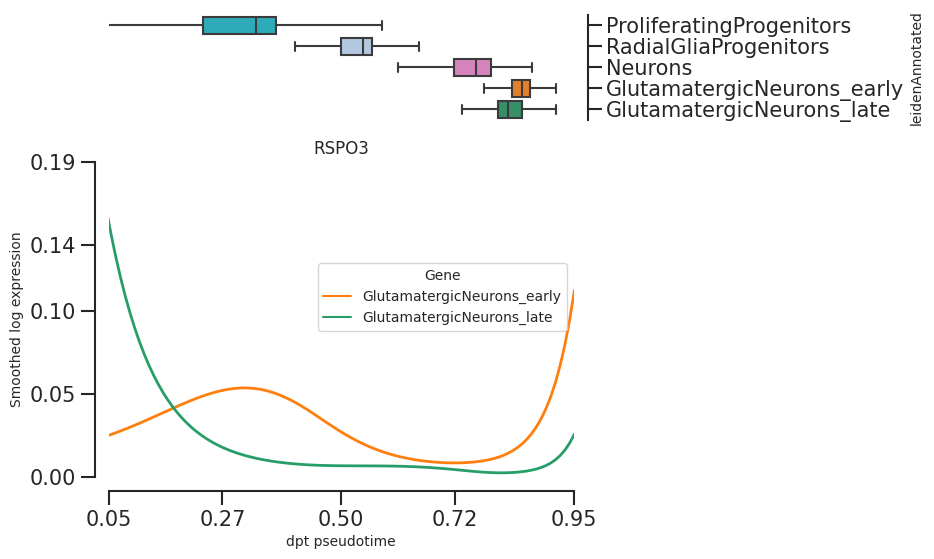

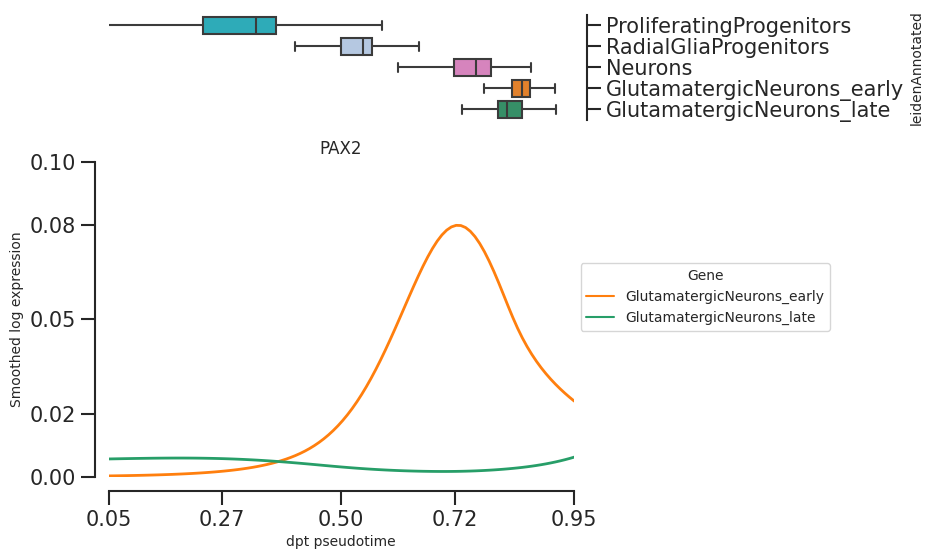

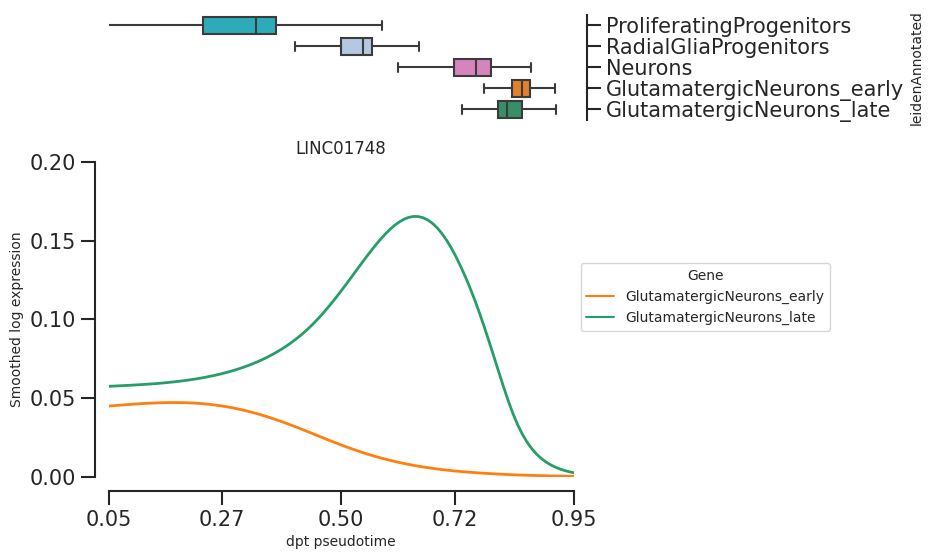

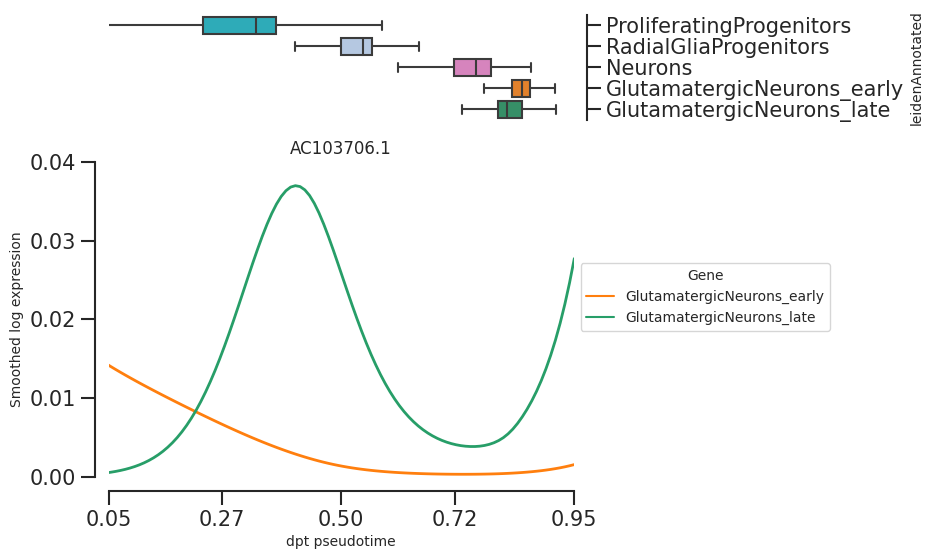

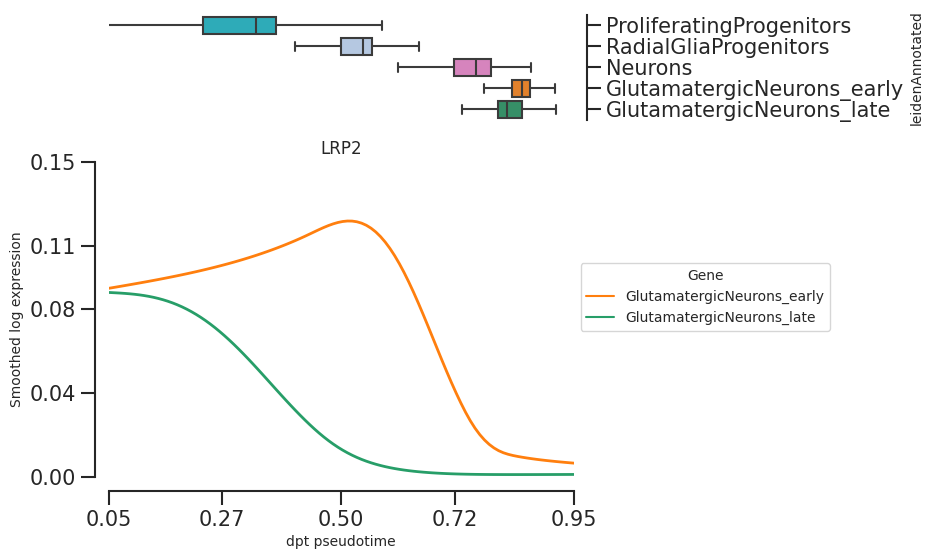

...

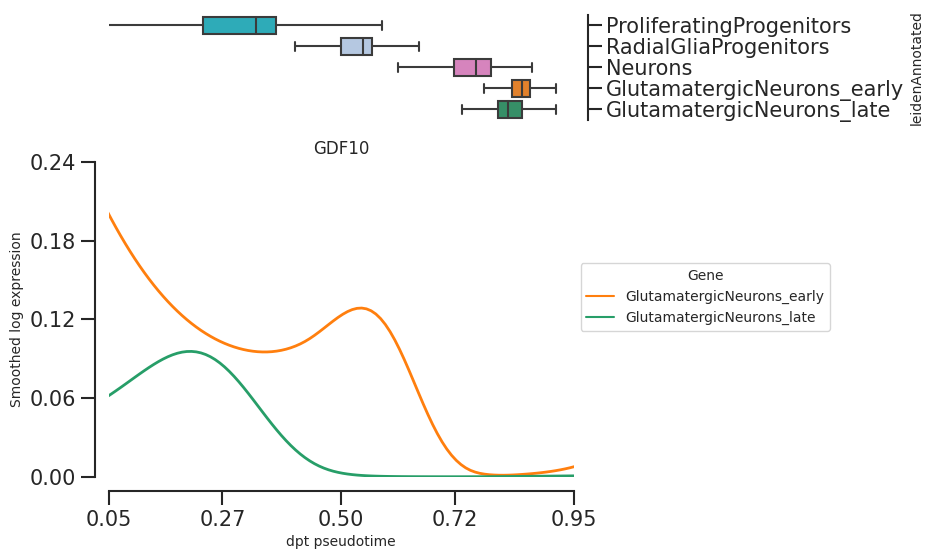

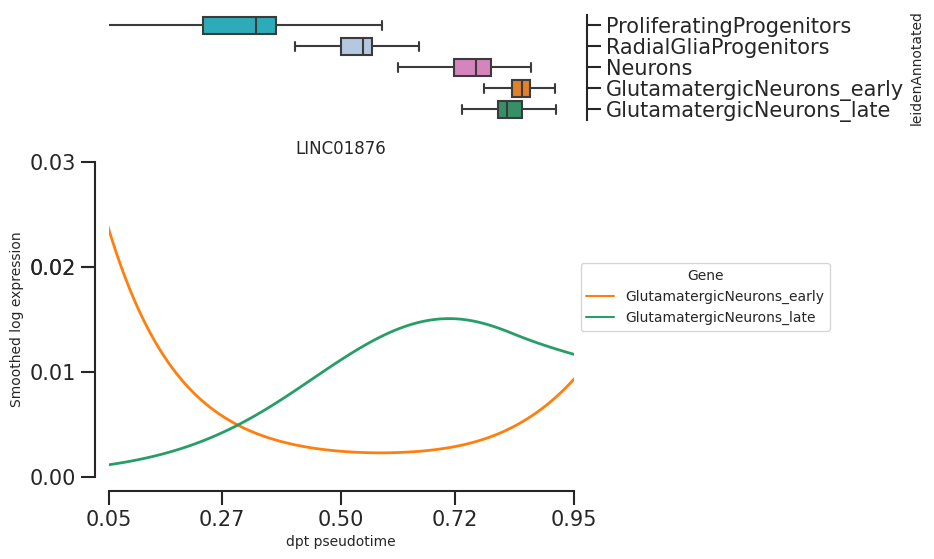

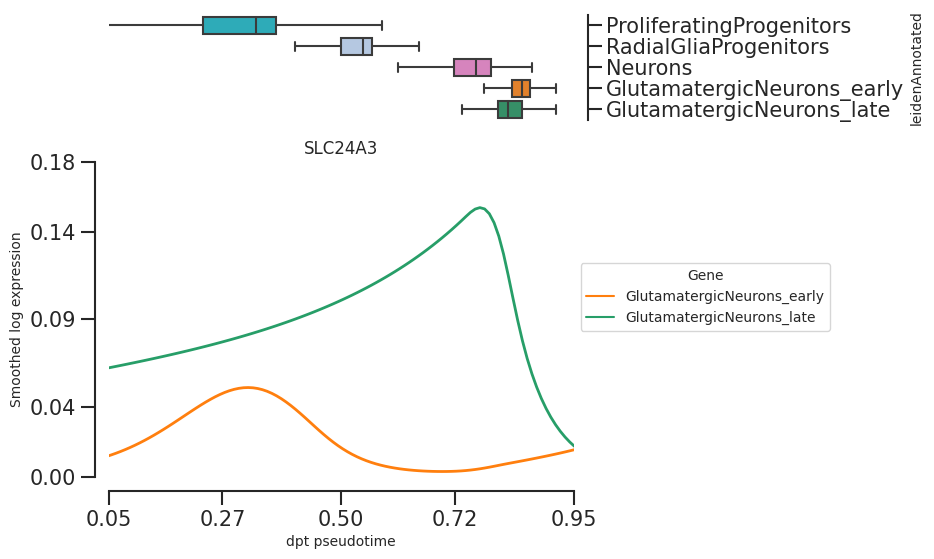

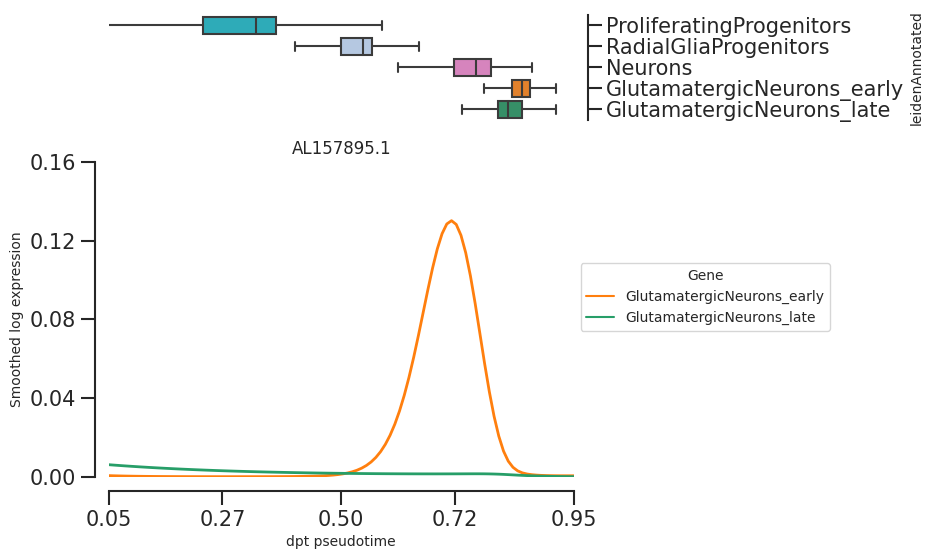

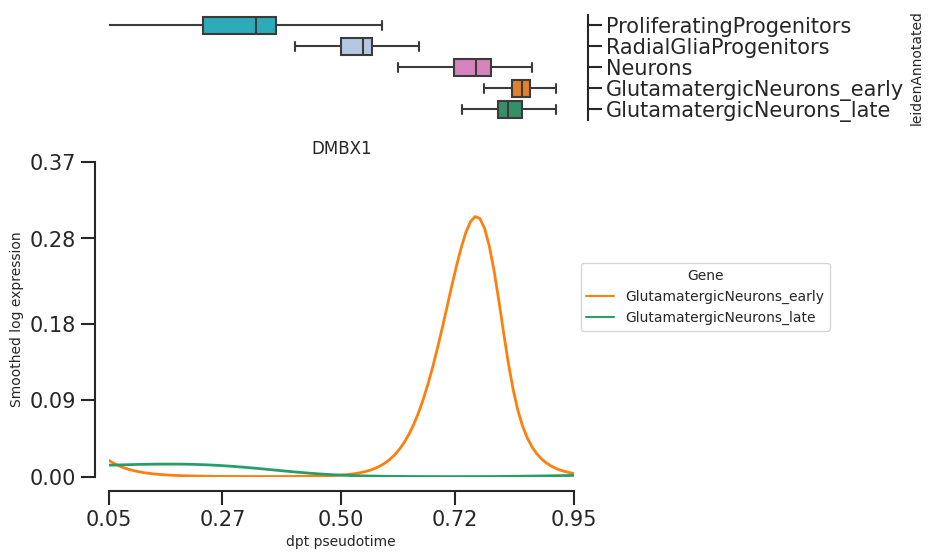

In [35]:
#Curatedmarkerslist = CuratedmarkersDF.loc[CuratedmarkersDF.score > 1,"name"].tolist()
#CuratedmarkersDF = pd.read_csv(markers, header=None, sep = "\t", names=["name","area","score"])
#Curatedmarkerslist = CuratedmarkersDF.loc[CuratedmarkersDF.score >= 1,"name"].tolist()

##############################


###################à

# We re-set index according to originally provided dpt range
TopTransientsExpr.index = np.linspace(minDPT, maxDPT,TopTransientsExpr.shape[0])


for m in TopTransients.tail(30).Gene.unique():


    
    
    plt.rcdefaults()

    sns.set_style("ticks", {'axes.grid' : False})


    fig, axes = plt.subplots(2,1, figsize=(6,6),sharex=True, 
                             gridspec_kw={'height_ratios': [1, 3]})
    
    plt.title(m)


    #fig, axes = plt.subplots(2,1, figsize=(10,5),sharex=True, 
    #                         gridspec_kw={'height_ratios': [1, 2]})

    #sns.histplot(data=adataTradeseq.obs, x="dpt_pseudotime", hue="leidenAnnotated", ax=axes[0])

    # sns.histplot(data=adataTradeseq.obs, x="dpt_pseudotime", hue="leidenAnnotated", ax=axes[0],bins=100,
    #               palette=dict(zip(adata.obs.leidenAnnotated.cat.categories, adata.uns["leidenAnnotated_colors"])), alpha=.5)


    sns.boxplot(data=adataTradeseq.obs, x="dpt_pseudotime", y="leidenAnnotated", ax = axes[0],
                palette=leidenCols,
                showfliers=False,order=leidenOrder)



    #axes[0].set(xlabel=None)
    #axes[0].tick_params(bottom=False)
    #axes[0].set(xticklabels=[])  
    #axes[0].legend(title='Smoker', bbox_to_anchor=(1.05, 1))

    #for m in ["S100A13","LMO3"]:
    
    cList = [c for c in TopTransientsExpr.columns.tolist() if "."+m+"." in c]
    if len(cList ) > 0:

        SmoothedExpr = TopTransientsExpr[cList].copy()
        SmoothedExpr["pseudotime"] = SmoothedExpr.index.tolist()      
        SmoothedExpr["pseudotime"] =  np.linspace(minDPT,maxDPT, 100)
        SmoothedExpr = SmoothedExpr.melt("pseudotime")
        TerminalLeiden = SmoothedExpr['variable'].str.split('_', expand = True)[[1,2]]
        SmoothedExpr['TerminalLeiden'] = TerminalLeiden[1]+'_'+TerminalLeiden[2]
        
        #TrimExtremes
        
        
        sns.lineplot(data=SmoothedExpr, x="pseudotime", y="value",palette=leidenCols,
                     hue= "TerminalLeiden",  linewidth=2, ax=axes[1])
        #axes[1].lines[1].set_linestyle("--")
        

        

        
        dptAxis = np.linspace(SmoothedExpr.pseudotime.min(), SmoothedExpr.pseudotime.max(), 5).round(2)   
        
        ylimits = np.array([SmoothedExpr.value.min()-(abs(SmoothedExpr.value.min())*.5), 
                            SmoothedExpr.value.max()+(SmoothedExpr.value.max()*.2)]).round(2)
        
        exprAxis = np.linspace(ylimits.min(), ylimits.max(),5).round(2)


        axes[1].set_xlim([dptAxis.min(), dptAxis.max()])
        axes[1].set_ylim(ylimits)


        axes[0].yaxis.tick_right()
        axes[0].spines[['left', 'top','bottom']].set_visible(False)
        axes[0].spines['right'].set_linewidth(1.5)
        axes[0].tick_params(axis='y', which='major', labelsize=15, width=1.5, length=10)
        axes[0].tick_params(axis='x', which='major', labelsize=15, width=0, length=10)
        axes[0].set_xlabel("", visible=False)



        axes[1].set_xticks(dptAxis)
        axes[1].set_yticks(exprAxis)

        axes[1].spines['left'].set_linewidth(1.5)
        axes[1].spines['bottom'].set_linewidth(1.5)
        axes[1].tick_params(axis='both', which='major', labelsize=15, width=1.5, length=10)
        axes[1].spines[['right', 'top']].set_visible(False)
        axes[1].xaxis.tick_bottom()
        axes[1].yaxis.tick_left()
        axes[1].legend(title='Gene', bbox_to_anchor=(1, .7))


        sns.despine(ax=axes[1], top=True, right=True, left=False, bottom=False, offset=10, trim=False)
        sns.despine(ax=axes[0], top=True, right=False, left=False, bottom=True, offset=10, trim=False)
        axes[0].yaxis.set_label_position("right")
        axes[0].spines[['left', 'top','bottom']].set_visible(False)

        axes[1].set(xlabel='dpt pseudotime', ylabel='Smoothed log expression')

        
        
fig.show()
        


#fig.savefig(figDir+'/Deltas.pdf',bbox_inches='tight')





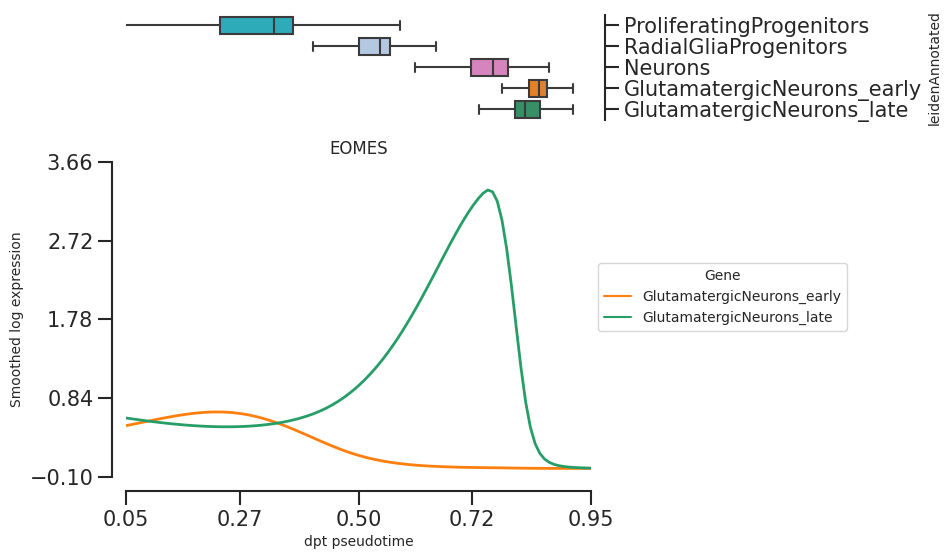

In [36]:
#Curatedmarkerslist = CuratedmarkersDF.loc[CuratedmarkersDF.score > 1,"name"].tolist()
#CuratedmarkersDF = pd.read_csv(markers, header=None, sep = "\t", names=["name","area","score"])
#Curatedmarkerslist = CuratedmarkersDF.loc[CuratedmarkersDF.score >= 1,"name"].tolist()

##############################


###################à

# We re-set index according to originally provided dpt range
TopTransientsExpr.index = np.linspace(minDPT, maxDPT,TopTransientsExpr.shape[0])


#for m in TopTransients.Gene.unique():
for m in ["EOMES"]:


    
    
    plt.rcdefaults()

    sns.set_style("ticks", {'axes.grid' : False})


    fig, axes = plt.subplots(2,1, figsize=(6,6),sharex=True, 
                             gridspec_kw={'height_ratios': [1, 3]})
    
    plt.title(m)


    #fig, axes = plt.subplots(2,1, figsize=(10,5),sharex=True, 
    #                         gridspec_kw={'height_ratios': [1, 2]})

    #sns.histplot(data=adataTradeseq.obs, x="dpt_pseudotime", hue="leidenAnnotated", ax=axes[0])

    # sns.histplot(data=adataTradeseq.obs, x="dpt_pseudotime", hue="leidenAnnotated", ax=axes[0],bins=100,
    #               palette=dict(zip(adata.obs.leidenAnnotated.cat.categories, adata.uns["leidenAnnotated_colors"])), alpha=.5)


    sns.boxplot(data=adataTradeseq.obs, x="dpt_pseudotime", y="leidenAnnotated", ax = axes[0],
                palette=leidenCols,
                showfliers=False,order=leidenOrder)



    #axes[0].set(xlabel=None)
    #axes[0].tick_params(bottom=False)
    #axes[0].set(xticklabels=[])  
    #axes[0].legend(title='Smoker', bbox_to_anchor=(1.05, 1))

    #for m in ["S100A13","LMO3"]:
    
    cList = [c for c in TopTransientsExpr.columns.tolist() if "."+m+"." in c]
    if len(cList ) > 0:

        SmoothedExpr = TopTransientsExpr[cList].copy()
        SmoothedExpr["pseudotime"] = SmoothedExpr.index.tolist()      
        SmoothedExpr["pseudotime"] =  np.linspace(minDPT,maxDPT, 100)
        SmoothedExpr = SmoothedExpr.melt("pseudotime")
        TerminalLeiden = SmoothedExpr['variable'].str.split('_', expand = True)[[1,2]]
        SmoothedExpr['TerminalLeiden'] = TerminalLeiden[1]+'_'+TerminalLeiden[2]
        
        #TrimExtremes
        
        
        sns.lineplot(data=SmoothedExpr, x="pseudotime", y="value",palette=leidenCols,
                     hue= "TerminalLeiden",  linewidth=2, ax=axes[1])
        #axes[1].lines[1].set_linestyle("--")
        

        

        
        dptAxis = np.linspace(SmoothedExpr.pseudotime.min(), SmoothedExpr.pseudotime.max(), 5).round(2)   
        
        ylimits = np.array([SmoothedExpr.value.min()-abs(((SmoothedExpr.value.min()*.5)+.1)), 
                            SmoothedExpr.value.max()+abs((SmoothedExpr.value.max()*.1))]).round(2)
        
        exprAxis = np.linspace(ylimits.min(), ylimits.max(),5).round(2)


        axes[1].set_xlim([dptAxis.min(), dptAxis.max()])
        axes[1].set_ylim(ylimits)


        axes[0].yaxis.tick_right()
        axes[0].spines[['left', 'top','bottom']].set_visible(False)
        axes[0].spines['right'].set_linewidth(1.5)
        axes[0].tick_params(axis='y', which='major', labelsize=15, width=1.5, length=10)
        axes[0].tick_params(axis='x', which='major', labelsize=15, width=0, length=10)
        axes[0].set_xlabel("", visible=False)



        axes[1].set_xticks(dptAxis)
        axes[1].set_yticks(exprAxis)

        axes[1].spines['left'].set_linewidth(1.5)
        axes[1].spines['bottom'].set_linewidth(1.5)
        axes[1].tick_params(axis='both', which='major', labelsize=15, width=1.5, length=10)
        axes[1].spines[['right', 'top']].set_visible(False)
        axes[1].xaxis.tick_bottom()
        axes[1].yaxis.tick_left()
        axes[1].legend(title='Gene', bbox_to_anchor=(1, .7))


        sns.despine(ax=axes[1], top=True, right=True, left=False, bottom=False, offset=10, trim=False)
        sns.despine(ax=axes[0], top=True, right=False, left=False, bottom=True, offset=10, trim=False)
        axes[0].yaxis.set_label_position("right")
        axes[0].spines[['left', 'top','bottom']].set_visible(False)

        axes[1].set(xlabel='dpt pseudotime', ylabel='Smoothed log expression')

        
        
        fig.show()
        


        fig.savefig(figDir+'/EOMESsmoothed.pdf',bbox_inches='tight')



